In [1]:
import pandas as pd
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from helper import *
from amftrack.notebooks.P_experiment.helper import get_polygons
%load_ext autoreload
%autoreload 2
plt.style.use('presentation.mplstyle')

%matplotlib widget

# Read the Excel file
path = r'C:\Users\coren\AMOLF-SHIMIZU Dropbox\Corentin Bisot\PC\Documents\PhD\Pexperiment'
path_excel = os.path.join(path,'summary.xlsx')
df = pd.read_excel(path_excel)
df['date_from_unique_id'] = pd.to_datetime(df['unique_id'].str.split('_').str[1], format='%Y%m%d')
    
# Convert 'day' column to datetime
df['day_sample'] = pd.to_datetime(df['day_sample'], format='%Y%m%d')  # Update the format as necessary
df['day_start'] = pd.to_datetime(df['start'], format='%Y%m%d')  # Update the format as necessary

df['time_elapsed'] = df['day_sample'] - df['day_start']
df['time_elapsed_day'] = df['time_elapsed'].dt.days
df['time_since_crossing'] = df['day_sample'] - df['date_from_unique_id']
df['t2 (day)'] = df['time_since_crossing'].dt.days
df['t1 (day)'] = df['time_elapsed_day']-df['t2 (day)']
df['prop_symb_growth'] = df['t2 (day)']/df['time_elapsed_day']

df['treatment'] = df['treatment'].fillna('none')


grouped = df.groupby(['plate', 'type',"time_elapsed_day","t1 (day)","treatment",'t2 (day)','prop_symb_growth']).agg({'totP (ug)': 'sum', 'wet weight': 'sum','dry weight' : "sum"}).reset_index()
grouped['C_P'] = grouped['totP (ug)'] / grouped['wet weight']
grouped['P_content'] = grouped['totP (ug)'] / grouped['dry weight']/1e6
grouped['dryweight_mg'] = grouped['dry weight']*1e3

df['C_P'] = df['totP (ug)'] / df['wet weight']
df['P_content'] = df['totP (ug)'] / df['dry weight']/1e6



c:\users\coren\documents\phd\code\amftrack\amftrack\util\dbx.py:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


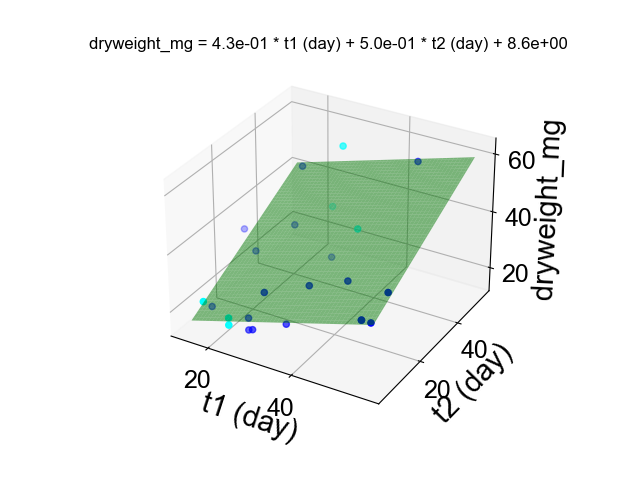

In [4]:
select = grouped[grouped['t2 (day)']>0]

fig,ax = plot_3d_plane('t1 (day)','t2 (day)','dryweight_mg',select)

In [2]:
grouped_0P = df.groupby(['plate', 'type']).agg({'totP (ug)': 'sum', 'wet weight': 'sum'}).reset_index()
grouped_0P = grouped_0P[grouped_0P['type']=="agar0P"]


datf = grouped_0P

# Function to compute concentration
def compute_concentration(df):
    total_totP = df['totP (ug)'].sum()
    total_wet_weight = df['wet weight'].sum()
    return total_totP / total_wet_weight

# Original concentration
original_concentration = compute_concentration(df)
print(f'Original Concentration: {original_concentration}')

# Bootstrap
n_iterations = 1000  # Number of bootstrap samples to create
bootstrap_estimates = []  # Initialize an empty list to keep the bootstrap concentration estimates

for i in range(n_iterations):
    # Generate a random bootstrap sample (same size as original sample, with replacement)
    bootstrap_sample = datf.sample(n=len(df), replace=True)
    
    # Compute the concentration from the bootstrap sample
    bootstrap_concentration = compute_concentration(bootstrap_sample)
    
    # Append the concentration to the list of bootstrap estimates
    bootstrap_estimates.append(bootstrap_concentration)

# Estimate the confidence intervals
confidence_level = 0.95
lower_percentile = (1.0 - confidence_level)/2.0 * 100
upper_percentile = (1.0 + confidence_level)/2.0 * 100
ci_lower = np.percentile(bootstrap_estimates, lower_percentile)
ci_upper = np.percentile(bootstrap_estimates, upper_percentile)

print(f'{confidence_level*100}% Confidence Interval for concentration: ({ci_lower}, {ci_upper})')


Original Concentration: 3.2505197933346897
95.0% Confidence Interval for concentration: (2.6848895464022378, 2.719285047242709)


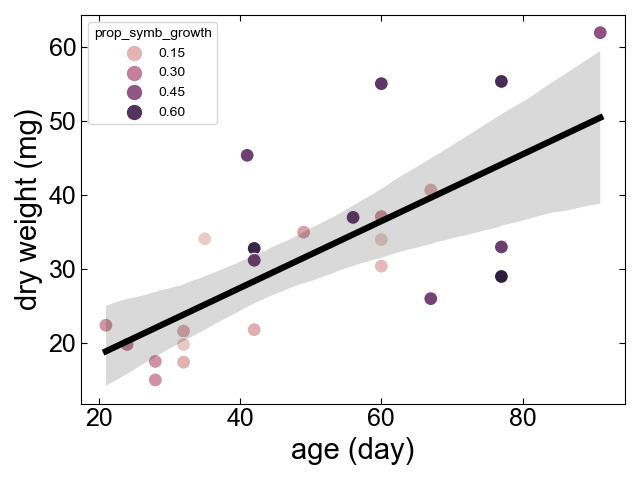

In [3]:
roots = grouped[grouped['type']=='root']
# roots = roots[roots['treatment']=='100P']
roots = roots[roots['t2 (day)']>0]


fig,ax = plt.subplots()
x = "time_elapsed_day"
sns.scatterplot(roots,x=x,y='dryweight_mg',hue = 'prop_symb_growth')
sns.regplot(roots,x=x,y='dryweight_mg',scatter=False,color="black")

# roots = grouped[grouped['type']=='root']
# roots = roots[roots['treatment']=='0P']
# sns.scatterplot(roots,x=x,y='dry weight',color = "cyan")
# for index,row in roots.iterrows():
#     ax.text(row[x],row['dry weight'],row['plate'])
ax.set_ylabel("dry weight (mg)")
ax.set_xlabel("age (day)")

plt.tight_layout()


C:\Users\coren\AppData\Local\Temp\ipykernel_17596\1255617949.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roots['P_needed'] = roots['dryweight_mg']*0.0021*1e3-roots['totP (ug)']


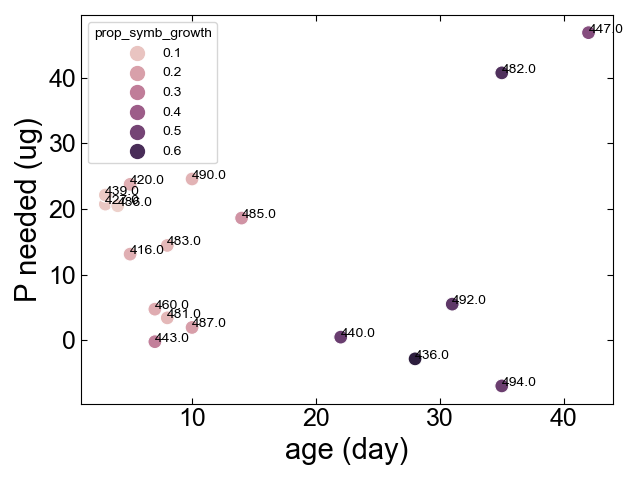

In [10]:
roots = grouped.loc[grouped['type']=='root']
roots['P_needed'] = roots['dryweight_mg']*0.0021*1e3-roots['totP (ug)']
roots = roots[roots['treatment']=='100P']
roots = roots[roots['t2 (day)']>0]
roots = roots[roots['plate']!=431]


fig,ax = plt.subplots()
x = 't2 (day)'
sns.scatterplot(roots,x=x,y='P_needed',hue = 'prop_symb_growth')
ax.set_ylabel("P needed (ug)")
ax.set_xlabel("age (day)")
for index,row in roots.iterrows():
    ax.text(row[x],row['P_needed'],row['plate'])
plt.tight_layout()


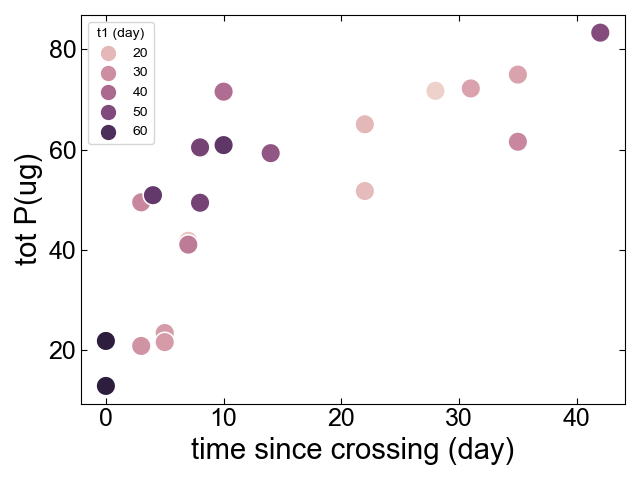

In [5]:
roots = grouped[grouped['type']=='root']
roots = roots[roots['treatment']=='100P']
# roots = roots[roots['t2 (day)']>0]
roots = roots[roots['totP (ug)']>0]


fig,ax = plt.subplots()
x = 't2 (day)'
sns.scatterplot(roots,x=x,y='totP (ug)',hue = 't1 (day)',s=200)
# sns.regplot(roots,x=x,y='totP (ug)',scatter=False,color="black")

roots = grouped[grouped['type']=='root']
roots = roots[roots['treatment']=='0P']
# sns.scatterplot(roots,x=x,y='totP (ug)',hue = 't1 (day)',marker="x")
# for index,row in roots.iterrows():
#     ax.text(row[x],row['dry weight'],row['plate'])
ax.set_ylabel("tot P(ug)")
ax.set_xlabel("time since crossing (day)")
# ax.legend('')
plt.tight_layout()


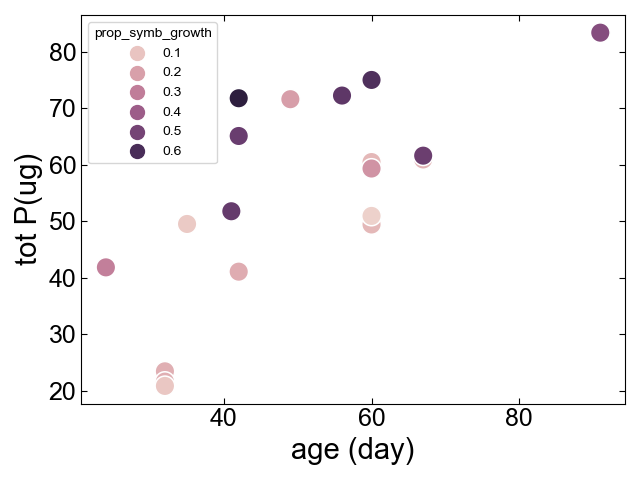

In [6]:
roots = grouped[grouped['type']=='root']
roots = roots[roots['treatment']=='100P']
roots = roots[roots['t2 (day)']>0]
roots = roots[roots['totP (ug)']>0]


fig,ax = plt.subplots()
x = "time_elapsed_day"
sns.scatterplot(roots,x=x,y='totP (ug)',hue = 'prop_symb_growth',s=200)
# sns.regplot(roots,x=x,y='totP (ug)',scatter=False,color="black")

# roots = grouped[grouped['type']=='root']
# roots = roots[roots['treatment']=='0P']
# sns.scatterplot(roots,x=x,y='dry weight',color = "cyan")
# for index,row in roots.iterrows():
#     ax.text(row[x],row['dry weight'],row['plate'])
ax.set_ylabel("tot P(ug)")
ax.set_xlabel("age (day)")

plt.tight_layout()


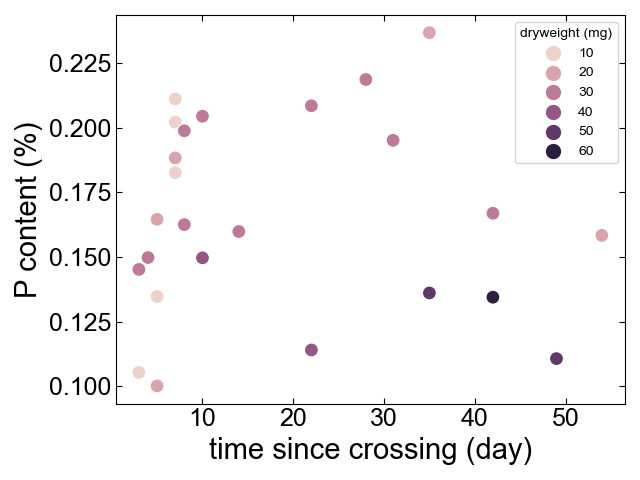

In [9]:
roots = grouped.loc[grouped['type']=='root'].copy()
roots['P_content_percent'] = roots['P_content']*100
roots['dryweight (mg)'] = roots['dryweight_mg'].astype(int)//10*10

roots = roots[roots['totP (ug)']>0]
roots = roots[roots['t2 (day)']>0]

x = 't2 (day)'

fig,ax = plt.subplots()
select = roots[roots['treatment']=='0P']

# sns.scatterplot(select,x=x,y='P_content_percent',hue = 'dryweight (mg)',marker="x",legend=False)
ax.legend('')
sns.scatterplot(roots,x=x,y='P_content_percent',hue = 'dryweight (mg)')

ax.set_xlabel('time since crossing (day)')
ax.set_ylabel('P content (%)')
plt.tight_layout()
# sns.regplot(roots,x=x,y='P_content',scatter=False,color="black")
# ax.scatter(roots['time_elapsed_day'],roots['P_content'])

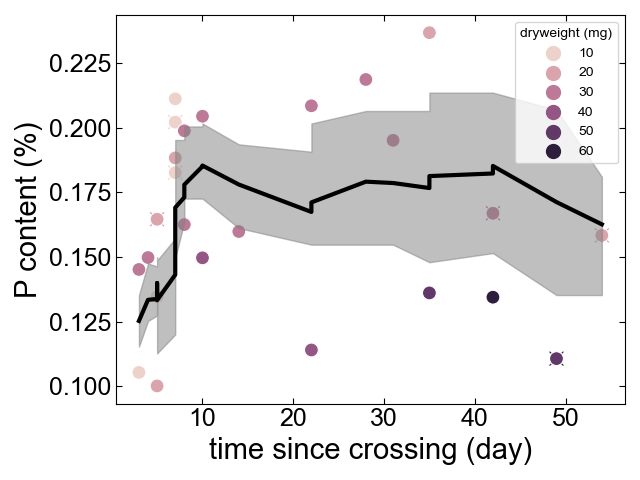

In [10]:
roots = grouped.loc[grouped['type']=='root'].copy()
roots['P_content_percent'] = roots['P_content']*100
roots['dryweight (mg)'] = roots['dryweight_mg'].astype(int)//10*10

roots = roots[roots['totP (ug)']>0]
roots = roots[roots['t2 (day)']>0]
roots.sort_values(by='t2 (day)', inplace=True)

# Calculate the rolling average and confidence interval
window_size = 7  # Adjust the window size as needed
roots['moving_avg'] = roots['P_content_percent'].rolling(window=window_size,min_periods = 2).mean()
roots['lower_ci'] = roots['P_content_percent'].rolling(window=window_size,min_periods = 2).quantile(0.25)
roots['upper_ci'] = roots['P_content_percent'].rolling(window=window_size,min_periods = 2).quantile(0.75)

x = 't2 (day)'

fig, ax = plt.subplots()
select = roots[roots['treatment']=='0P']

sns.scatterplot(select,x=x,y='P_content_percent',hue = 'dryweight (mg)',marker="x",legend=False)
# Scatterplot
sns.scatterplot(data=roots, x=x, y='P_content_percent', hue='dryweight (mg)', ax=ax)

# Moving Average line
ax.plot(roots[x], roots['moving_avg'], color='black', label='Moving Avg')

# Confidence Interval
ax.fill_between(roots[x], roots['lower_ci'], roots['upper_ci'], color='grey', alpha=0.5, label='Confidence Interval')

ax.set_xlabel('time since crossing (day)')
ax.set_ylabel('P content (%)')
plt.tight_layout()

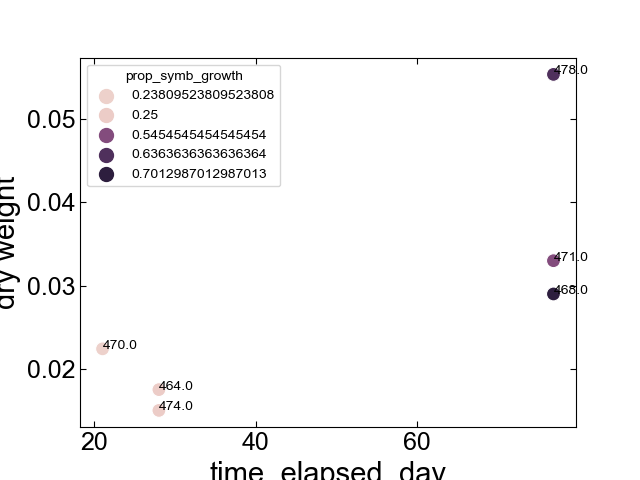

In [54]:
fig,ax = plt.subplots()

roots = grouped[grouped['type']=='root']
roots = roots[roots['treatment']=='0P']
sns.scatterplot(roots,x=x,y='dry weight',hue = 'prop_symb_growth')
for index,row in roots.iterrows():
    ax.text(row[x],row['dry weight'],row['plate'])

In [25]:
df_harvest = pd.read_excel("2022_CarbonExperiment.xlsx",sheet_name="harvest")
df_harvest['start'] = pd.to_datetime(df_harvest['start'], errors='coerce')
df_harvest['crossed']  = pd.to_datetime(df_harvest['crossed'], errors='coerce')
df_harvest['harvest']  = pd.to_datetime(df_harvest['harvest'], errors='coerce')
df_harvest['time_elapsed'] = df_harvest['harvest'] - df_harvest['start']
df_harvest['time_elapsed_day'] = df_harvest['time_elapsed'].dt.days
df_harvest['time_since_crossing'] = df_harvest['harvest'] - df_harvest['crossed']
df_harvest['t2 (day)'] = df_harvest['time_since_crossing'].dt.days
df_harvest['t1 (day)'] = df_harvest['time_elapsed_day']-df_harvest['t2 (day)']
df_harvest['prop_symb_growth'] = df_harvest['t2 (day)']/df_harvest['time_elapsed_day']
df_harvest.columns

Index(['#', 'treatment', 'fungus', 'start', 'crossed', 'harvest',
       'days until harvest', 'fresh root [g]', 'dry root [mg]', 'agar root[g]',
       'agar left [g]', 'agar right [g]', 'Remarks', 'time_elapsed',
       'time_elapsed_day', 'time_since_crossing', 't2 (day)', 't1 (day)',
       'prop_symb_growth'],
      dtype='object')

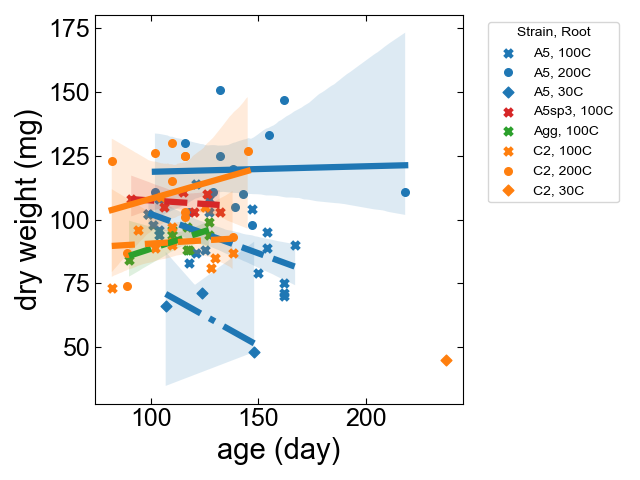

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

# Unique combinations of strain and real_root
combinations = df_harvest.groupby(['fungus', 'treatment']).size().index

# Define a color palette for the strains and a linestyle for the real_roots
unique_strains = df_harvest['fungus'].unique()
palette = sns.color_palette('tab10', len(unique_strains))
strain_to_color = {strain: palette[i] for i, strain in enumerate(unique_strains)}

unique_roots = df_harvest['treatment'].unique()
linestyles = ['-', '--', '-.', ':']
root_to_linestyle = {root: linestyles[i % len(linestyles)] for i, root in enumerate(unique_roots)}

# The marker styles for scatter points corresponding to linestyles
linestyle_to_marker = {'-': 'o', '--': 'x', '-.': 'D', ':': 'X'}

for strain, real_root in combinations:
    select = df_harvest[(df_harvest['fungus'] == strain) & (df_harvest['treatment'] == real_root)]
    
    # Plot scatter points separately
    ax.scatter(select['time_elapsed_day'], select['dry root [mg]'], color=strain_to_color[strain], 
               marker=linestyle_to_marker[root_to_linestyle[real_root]], s=30, label=f'{strain}, {real_root}')
    
    # Plot regression line without scatter points using sns.regplot
    sns.regplot(data=select, x='time_elapsed_day', y='dry root [mg]', ax=ax, 
                color=strain_to_color[strain], scatter=False, 
                line_kws={'linestyle': root_to_linestyle[real_root]})

ax.set_xlabel('age (day)')
ax.set_ylabel("dry weight (mg)")
ax.legend(title="Strain, Root", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


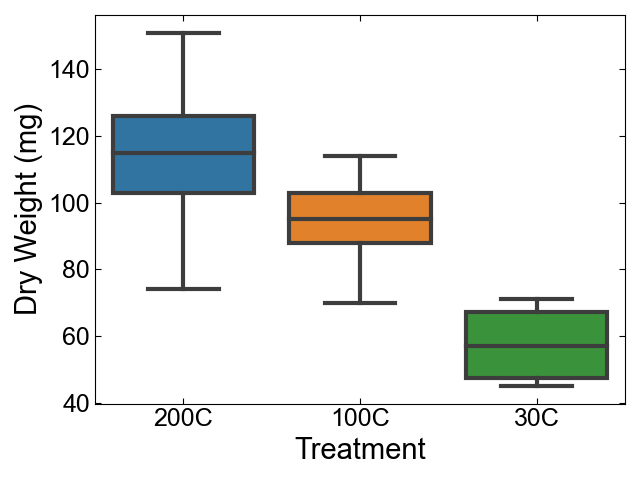

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot of dry root weight for each treatment
plt.figure()
sns.boxplot(data=df_harvest, x='treatment', y='dry root [mg]', palette='tab10')

plt.xlabel('Treatment')
plt.ylabel('Dry Weight (mg)')
# plt.title('Boxplot of Dry Weight for Each Treatment')
plt.tight_layout()
plt.show()


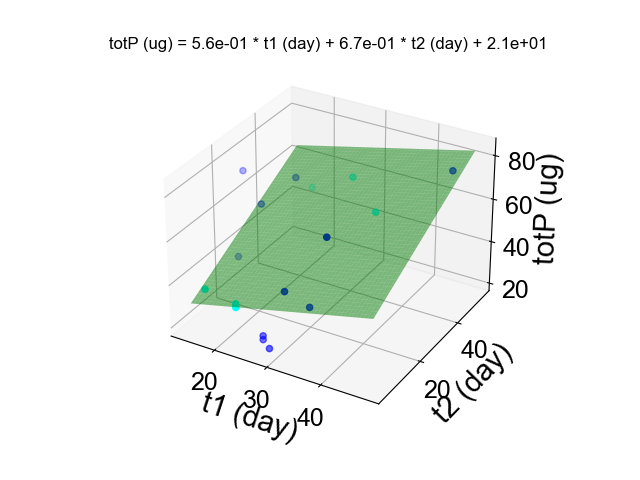

In [10]:
fig,ax = plot_3d_plane('t1 (day)','t2 (day)','totP (ug)',grouped)


In [13]:
grouped['plate'].unique()

array([416., 420., 427., 431., 436., 439., 440., 443., 447., 460., 463.,
       464., 468., 470., 471., 474., 478., 481., 482., 483., 485., 486.,
       487., 490., 491., 492., 494., 495.])

Text(0.5, 0, 'dry weight (g)')

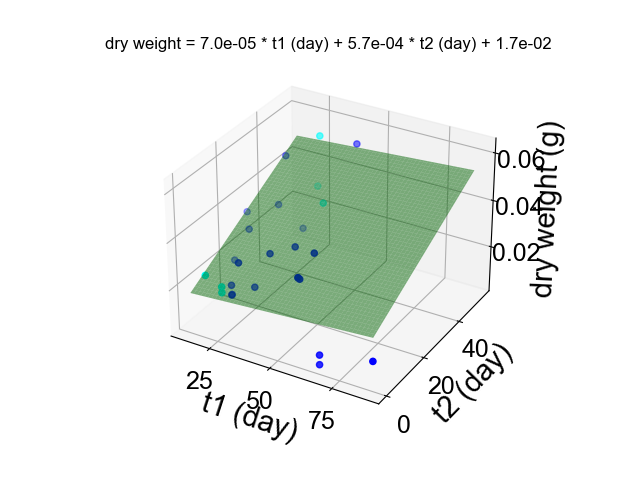

In [3]:
fig,ax = plot_3d_plane('t1 (day)','t2 (day)','dry weight',grouped)
ax.set_zlabel("dry weight (g)")

In [24]:
def root_growth(m_r_initial, m_p_func, f_func, dt, total_time):
    """
    m_r_initial: Initial mass of the root.
    m_p_func: Function that returns mass of P as a function of time.
    f_func: Function that returns growth rate of the root as a function of P concentration.
    dt: Time step size for Euler's method.
    total_time: Total time for which the growth needs to be computed.
    
    Returns a list of root masses over time.
    """
    
    m_r = m_r_initial
    root_masses = [m_r]
    time_steps = int(total_time / dt)
    t = 0
    for _ in range(time_steps):
        m_p +=
        a = f_func(m_p / m_r)
        m_r += a * dt
        root_masses.append(m_r)
        t+=dt
        

    return root_masses

# Example usage:
def m_p_func(t):
    # Placeholder function, returns a linear growth of P mass over time.
    return gamma * t

def f_func(C_p):
    # Placeholder function, linear relation between a and C_p.
    return C_p

root_masses = root_growth(1.0, m_p_func, f_func, 0.01, 10)
print(root_masses)


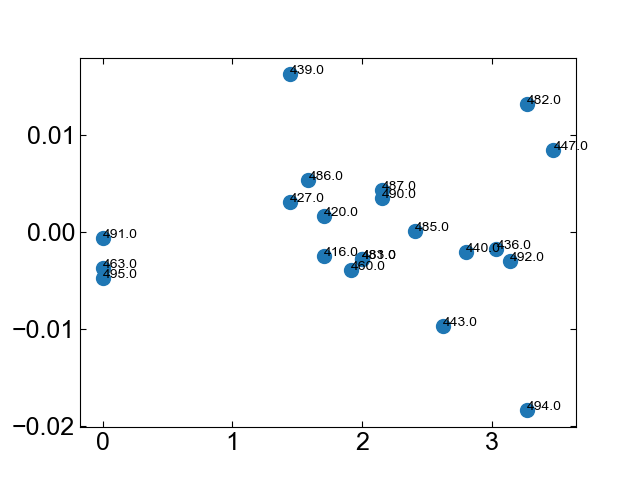

In [34]:
roots = grouped[grouped['type'] == "root"]
roots = roots[roots['plate'] != 431]
roots = roots[roots['plate'] >= 10]
roots = roots[roots['treatment']=='100P']

xlabel,ylabel,zlabel = 't1 (day)','t2 (day)','dry weight'
# Extract the data
x = roots[xlabel].values
y = roots[ylabel].values**(1/3)
z = roots[zlabel].values

# Prepare the data for least squares fitting
# We use a constant term of 1 to account for the D coefficient
A = np.c_[x, y, np.ones(x.shape)]

# Perform least squares fitting
C, _, _, _ = np.linalg.lstsq(A, z, rcond=None)

# The plane equation will be of the form: z = Ax + By + D
A_fit, B_fit, D_fit = C

# Calculate corresponding z from the plane equation
zz = A_fit * x + B_fit * y + D_fit
fig,ax = plt.subplots()
ax.scatter(y,z-zz)
i=0
for index,row in roots.iterrows():
    ax.text(y[i],(z-zz)[i],row['plate'])
    i+=1

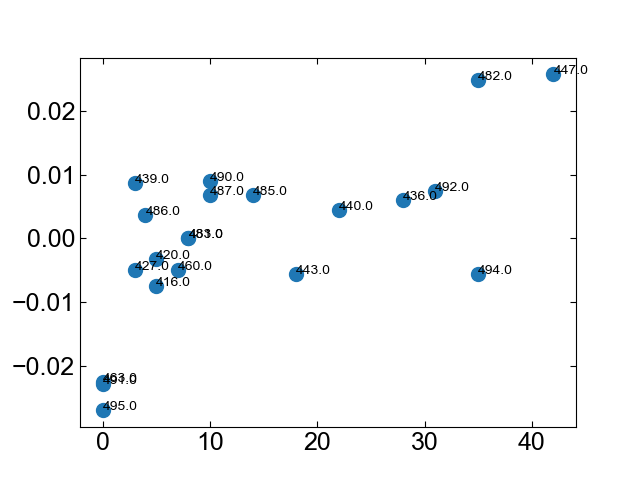

In [28]:
roots = grouped[grouped['type'] == "root"]
roots = roots[roots['plate'] != 431]
roots = roots[roots['plate'] >= 10]
roots = roots[roots['treatment']=='100P']

xlabel,ylabel,zlabel = 'time_elapsed_day','t2 (day)','dry weight'
# Extract the data
x = roots[xlabel].values
y = roots[ylabel].values
z = roots[zlabel].values
# Prepare the data for least squares fitting
# We use a constant term of 1 to account for the D coefficient
A = np.c_[x,  np.ones(x.shape)]

# Perform least squares fitting
C, _,_,_ = np.linalg.lstsq(A, z, rcond=None)

# The plane equation will be of the form: z = Ax + By + D
A_fit, D_fit = C

# Calculate corresponding z from the plane equation
zz = A_fit * x  + D_fit
fig,ax = plt.subplots()
ax.scatter(y,z-zz)
i=0
for index,row in roots.iterrows():
    ax.text(y[i],(z-zz)[i],row['plate'])
    i+=1

In [19]:
np.linalg.lstsq(A, z, rcond=None)

(array([0.00027413, 0.014343  ]),
 array([0.00414127]),
 2,
 array([296.90389697,   1.75384217]))

In [12]:
index

30

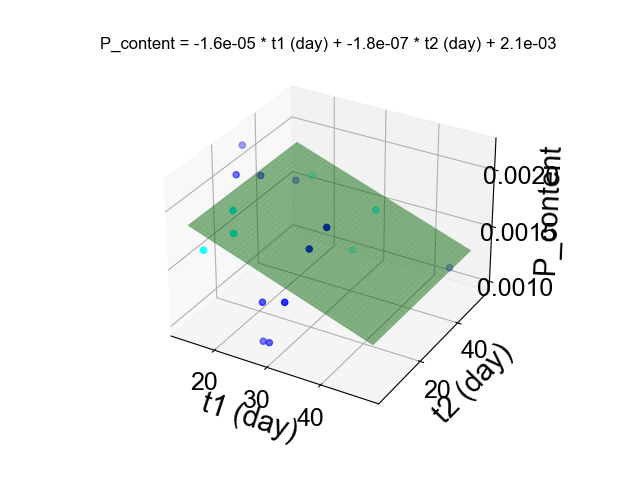

In [12]:
fig,ax = plot_3d_plane('t1 (day)','t2 (day)','P_content',grouped)

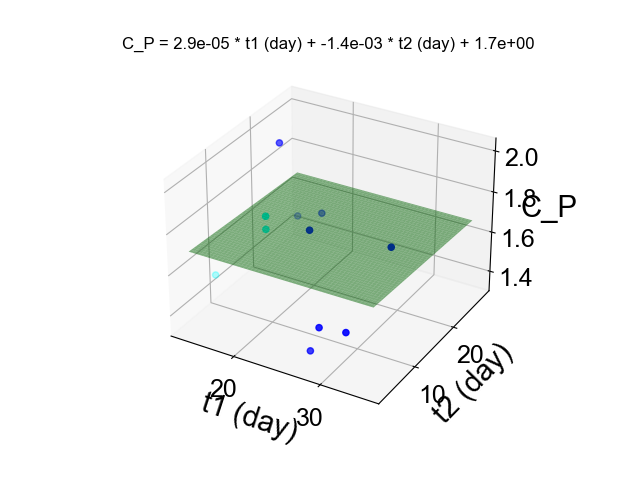

In [65]:
fig,ax = plot_3d_plane('t1 (day)','t2 (day)','C_P',grouped,"rootagar")

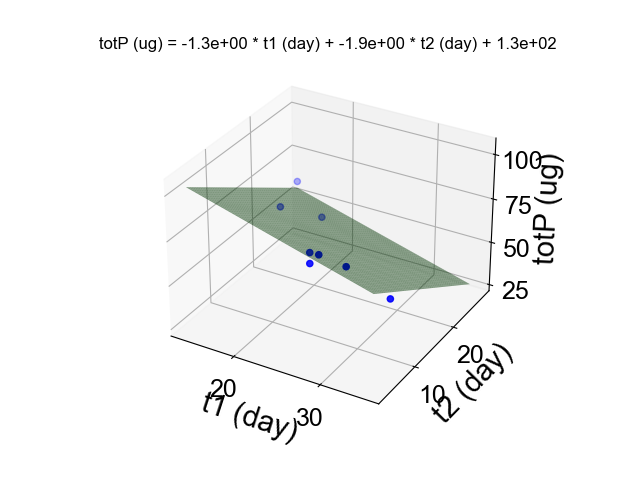

In [66]:
fig,ax = plot_3d_plane('t1 (day)','t2 (day)','totP (ug)',grouped,"agar",treatments= ["100P"])

Text(0, 0.5, 'C_P of type root agar')

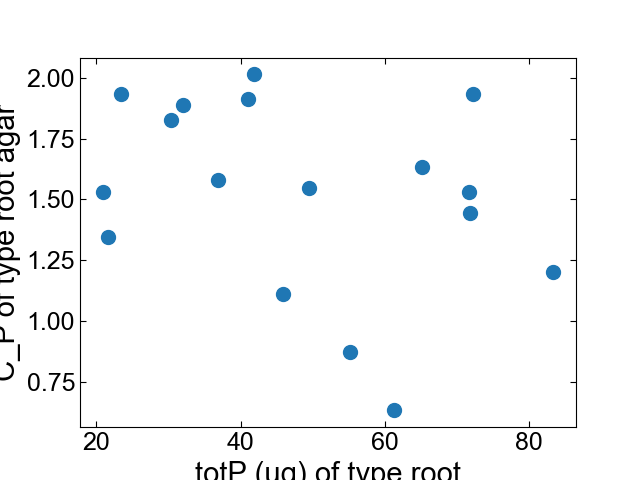

In [8]:
fig,ax = plt.subplots()

# Assume 'grouped' is your original DataFrame

# Filter DataFrames for 'root' and 'root agar'
df_root = grouped[grouped['type'] == 'root']
df_root_agar = grouped[grouped['type'] == 'rootagar']

# Drop rows where 'plate' is 431 for 'root'
df_root = df_root[df_root['plate'] != 431]

# Create DataFrames with only 'plate' and the column of interest
df_root = df_root[['plate', 'totP (ug)']]
df_root_agar = df_root_agar[['plate', 'C_P']]

# Merge the two DataFrames on 'plate'
merged_df = pd.merge(df_root, df_root_agar, on='plate')

# Plotting
ax.scatter(merged_df['totP (ug)'], merged_df['C_P'])
ax.set_xlabel('totP (ug) of type root')
ax.set_ylabel('C_P of type root agar')
# ax.title('Scatter Plot of C_P vs totP by Plate')
# plt.show()


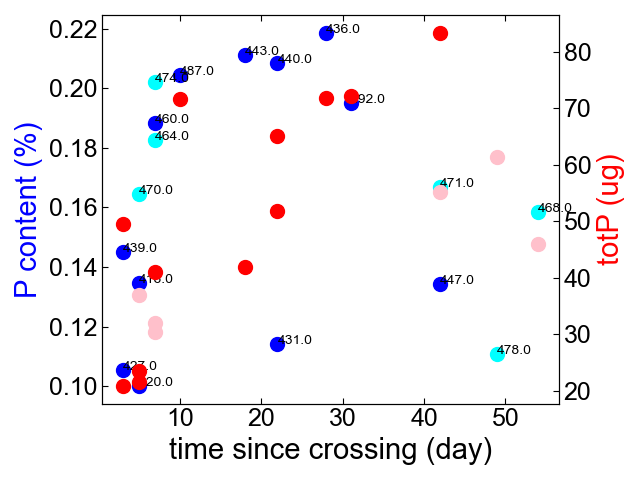

In [16]:
# Assuming 'grouped' is your original DataFrame and 'roots' is a filtered DataFrame
roots = grouped[grouped['type']=='root']
# roots = roots[roots['plate']!=431]

# Create two masks for '100P' and '0P'
mask_100P = roots['treatment'] == '100P'
mask_0P = roots['treatment'] == '0P'

fig, ax = plt.subplots()

# Plot for '100P' treatment with original blue and red colors
ax.scatter(roots[mask_100P]['t2 (day)'], roots[mask_100P]['totP (ug)']/roots[mask_100P]['dry weight']/1e4, color='blue')
for index,row in roots.iterrows():
    ax.text(row['t2 (day)'],row['totP (ug)']/row['dry weight']/10000,row['plate'])
ax2 = ax.twinx()
ax2.scatter(roots[mask_100P]['t2 (day)'], roots[mask_100P]['totP (ug)'], color='red')

# Plot for '0P' treatment with new cyan and pink colors
ax.scatter(roots[mask_0P]['t2 (day)'], roots[mask_0P]['totP (ug)']/roots[mask_0P]['dry weight']/1e4, color='cyan')
ax2.scatter(roots[mask_0P]['t2 (day)'], roots[mask_0P]['totP (ug)'], color='pink')

# Labels and formatting
ax.set_xlabel("time since crossing (day)")
ax.set_ylabel("P content (%)", color="blue")
ax2.set_ylabel("totP (ug)", color="red")
plt.tight_layout()

plt.show()


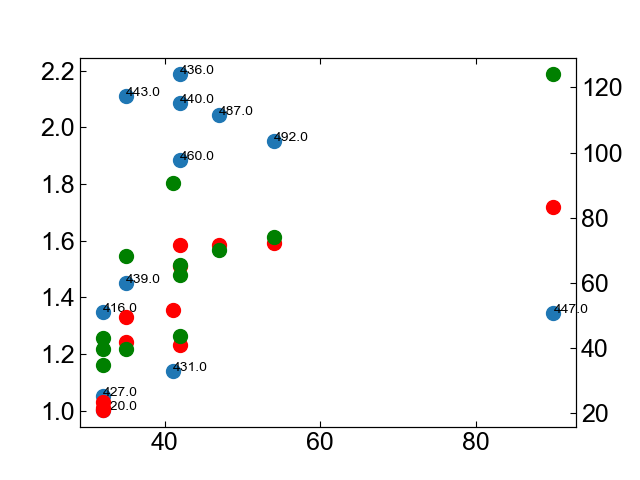

In [15]:
roots = grouped[grouped['type']=='root']
# roots = roots[roots['plate']!=431]
roots = roots[roots['treatment']=='100P']

fig,ax = plt.subplots()
ax.scatter(roots['time_elapsed_day'],roots['totP (ug)']/roots['dry weight']/1000)
for index,row in roots.iterrows():
    ax.text(row['time_elapsed_day'],row['totP (ug)']/row['dry weight']/1000,row['plate'])
ax2 = ax.twinx()
ax2.scatter(roots['time_elapsed_day'],roots['totP (ug)'],color = "red")
ax2.scatter(roots['time_elapsed_day'],roots['dry weight']*2000,color = "green")


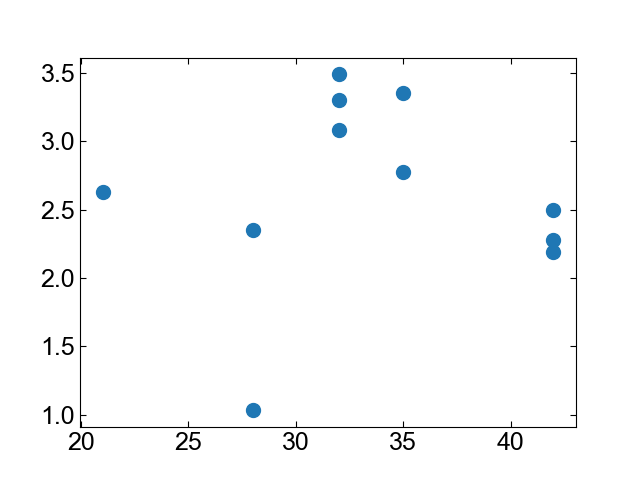

In [124]:
roots = grouped[grouped['type']=='agar']
roots = roots[roots['plate']!=431]

fig,ax = plt.subplots()
ax.scatter(roots['time_elapsed_day'],roots['totP (ug)']/roots['wet weight'])



,plate,type,time_elapsed_day,t1 (day),treatment,t2 (day),totP (ug),wet weight,dry weight,C_P,P_content


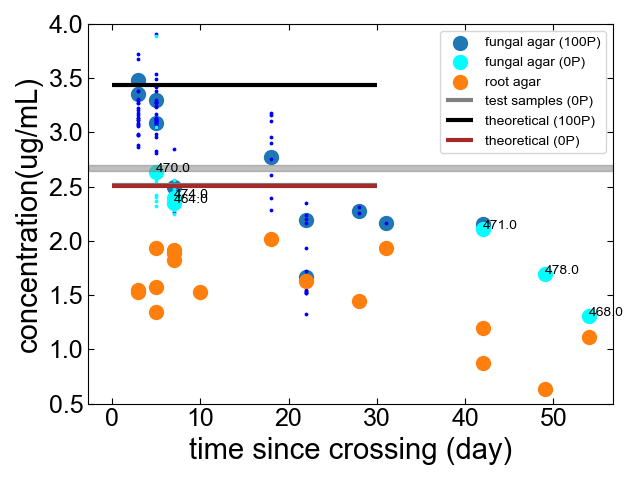

In [14]:
roots = grouped[grouped['type']=='agar']
roots = roots[roots['treatment']=='100P']
# roots = roots[roots['plate']!=431]
df_select = df[df['type']=='agar']
df_select = df_select[df_select['treatment']=='100P']
# df_select = df_select[df_select['plate']!=431]

fig,ax = plt.subplots()
ax.scatter(roots['t2 (day)'],roots['totP (ug)']/roots['wet weight'], label = "fungal agar (100P)")
ax.scatter(df_select['t2 (day)'],df_select['totP (ug)']/df_select['wet weight'],color="blue",s=3)

roots = grouped[grouped['type']=='agar']
roots = roots[roots['treatment']=='0P']
df_select = df[df['type']=='agar']
df_select = df_select[df_select['treatment']=='0P']
# df_select = df_select[df_select['plate']!=431]
ax.scatter(roots['t2 (day)'],roots['totP (ug)']/roots['wet weight'],color="cyan", label = "fungal agar (0P)")
ax.scatter(df_select['t2 (day)'],df_select['totP (ug)']/df_select['wet weight'],color="cyan",s=3)

for index,row in roots.iterrows():
    ax.text(row['t2 (day)'],row['C_P'],row['plate'])
roots = grouped[grouped['type']=='rootagar']

roots = roots[roots['plate']!=431]
ax.scatter(roots['t2 (day)'],roots['totP (ug)']/roots['wet weight'],label = "root agar")

mean0P = np.median(df[df['type']=='agar0P']['C_P'])
std = np.std(df[df['type']=='agar0P']['C_P'])

ax.set_ylabel('concentration(ug/mL)')
ax.set_xlabel('time since crossing (day)')

ax.hlines(mean0P,0,30, color = "grey",label = "test samples (0P)")
ax.hlines(3.44,0,30, color = "black",label = "theoretical (100P)")
ax.hlines(2.51,0,30, color = "brown",label = "theoretical (0P)")
lower_bound = ci_lower
upper_bound = ci_upper
ax.axhspan(lower_bound, upper_bound, color='grey', alpha=0.5)
ax.set_ylim(0.5,4)
              
ax.legend()
plt.tight_layout()

In [31]:
roots

,plate,type,time_elapsed_day,t1 (day),treatment,t2 (day),totP (ug),wet weight,dry weight,C_P,P_content
2,416.0,rootagar,32.0,27.0,100P,5.0,43.395117,22.4710,0.0,1.931161,inf
5,420.0,rootagar,32.0,27.0,100P,5.0,30.123966,22.3550,0.0,1.347527,inf
8,427.0,rootagar,32.0,29.0,100P,3.0,36.141996,23.6330,0.0,1.529302,inf
14,436.0,rootagar,42.0,14.0,100P,28.0,31.724392,21.9639,0.0,1.444388,inf
17,439.0,rootagar,35.0,32.0,100P,3.0,35.557439,22.9996,0.0,1.546003,inf
20,440.0,rootagar,42.0,20.0,100P,22.0,34.205968,20.9393,0.0,1.633577,inf
23,443.0,rootagar,35.0,17.0,100P,18.0,45.372982,22.5348,0.0,2.013463,inf
27,447.0,rootagar,89.0,47.0,100P,42.0,4.513316,3.7573,0.0,1.201213,inf
31,460.0,rootagar,42.0,35.0,100P,7.0,43.666187,22.8118,0.0,1.914193,inf
34,464.0,rootagar,28.0,21.0,0P,7.0,43.095322,22.8051,0.0,1.889723,inf


Text(0, 0.5, 'root agar P concentration (ug/mL)')

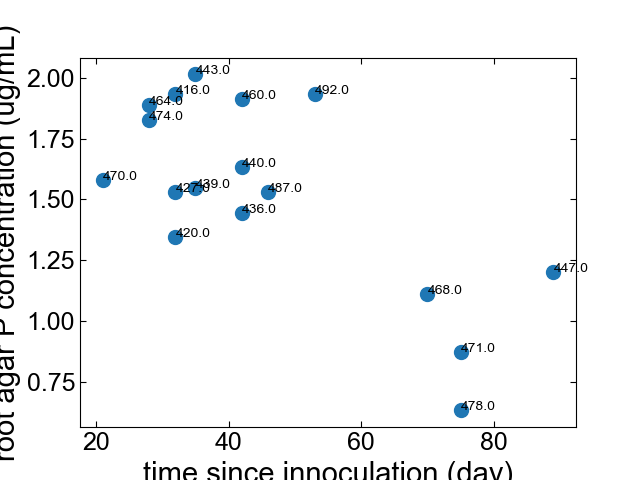

In [35]:
fig,ax = plt.subplots()
roots = grouped[grouped['type']=='rootagar']

roots = roots[roots['plate']!=431]
x = 'time_elapsed_day'
ax.scatter(roots[x],roots['C_P'])
for index,row in roots.iterrows():
    ax.text(row[x],row['C_P'],row['plate'])
ax.set_xlabel('time since innoculation (day)')
ax.set_ylabel('root agar P concentration (ug/mL)')

2
2
1
1


KeyError: 'rootagartot'

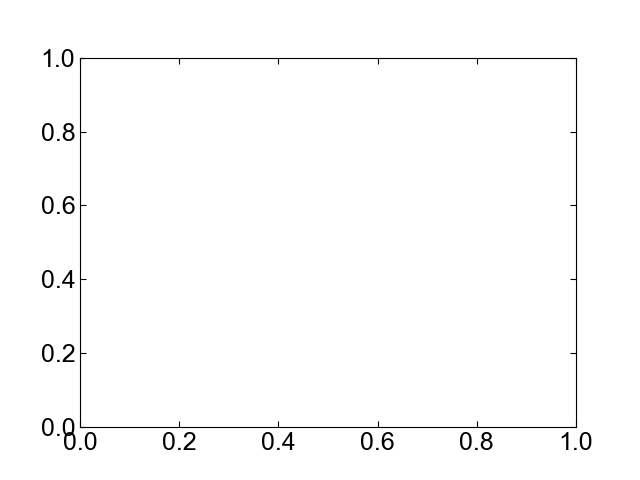

In [17]:


# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
select = df[df['treatment']=='100P']
select = select[select['plate']!=431]
select = select[select['plate']>0]



grouped = select.groupby(['t2 (day)', 'type']).agg({'totP (ug)' :'sum'}).reset_index()

# Create a dictionary to map 'type' to a specific color
color_dict = {'root': 'red', 'agar': 'blue', 'rootagar': 'purple'}

# Create the bar plot
fig, ax = plt.subplots()

# Get unique plates to set as categorical x-ticks
unique_times = grouped['t2 (day)'].unique()

# Initialize empty lists to hold bar heights for each plate
bar_data = {time: [] for time in unique_times}
bar_colors = {time: [] for time in unique_times}

# Prepare the data
for time in unique_times:
    # Filter data for each plate
    plate_data = grouped[grouped['t2 (day)'] == time]
    select_time = select[select['t2 (day)'] == time]

    # Initialize the bottom for the stacked bar
    bottom = 0
    num_plates = len(select_time["plate"].unique())
    print(num_plates)
    for index, row in plate_data.iterrows():
        # Add bar heights and colors
        bar_data[time].append(row['totP (ug)']/num_plates)
        bar_colors[time].append(color_dict[row['type']])

    # Plot the bars
for i, time in enumerate(unique_times):
    ax.bar(time, bar_data[time], bottom=[sum(bar_data[time][:j]) for j in range(len(bar_data[time]))], color=bar_colors[time])

# Add legend and labels
custom_legend = [plt.Rectangle((0,0),1,1, color=color_dict[key]) for key in color_dict.keys()]
ax.legend(custom_legend, ['root','fungal agar','root agar'], title='Types')

# Set x-ticks and labels
# ax.set_xticks(range(len(unique_plates)))
# ax.set_xticklabels([str(p) for p in unique_plates])

ax.set_xlabel('time since crossing (day)')
ax.set_ylabel('Total P (ug)')
# ax.set_ylim(0,120)
plt.tight_layout()


In [106]:
import matplotlib.pyplot as plt

# Assuming df is already defined
select = df[df['treatment']=='100P']
select = select[select['plate']!=431]
select = select[select['plate']>0]
grouped = select.groupby(['t2 (day)', 'type']).agg({'totP (ug)': 'sum'}).reset_index()

# Initialize dictionaries to hold y-values for each 'type'
root_values = {}
agar_values = {}
rootagar_values = {}

# Initialize a list for unique times
unique_times = []

# Populate the dictionaries and list
for index, row in grouped.iterrows():
    time = row['t2 (day)']
    select_time = select[select['t2 (day)'] == time]
    num_plates = len(select_time["plate"].unique())
    
    if time not in unique_times:
        unique_times.append(time)
    
    if row['type'] == 'root':
        root_values[time] = row['totP (ug)']/num_plates
    elif row['type'] == 'agar':
        agar_values[time] = row['totP (ug)']/num_plates
    elif row['type'] == 'rootagar':
        rootagar_values[time] = row['totP (ug)']/num_plates

# Sort unique_times and fill in missing values with zeros
unique_times.sort()
root_values_list = [root_values.get(t, 0) for t in unique_times]
agar_values_list = [agar_values.get(t, 0) for t in unique_times]
rootagar_values_list = [rootagar_values.get(t, 0) for t in unique_times]

# Create the stackplot
# fig, ax = plt.subplots()

ax.stackplot(unique_times,agar_values_list, root_values_list, rootagar_values_list, labels=['Fungal agar', 'Root', 'Root agar'], colors=['blue', 'red', 'purple'],alpha = 0.4)

ax.legend()
ax.set_xlabel('Time Since Crossing (Day)')
ax.set_ylabel('Total P (ug)')
plt

<module 'matplotlib.pyplot' from 'C:\\Users\\coren\\anaconda3\\envs\\amftrack\\lib\\site-packages\\matplotlib\\pyplot.py'>

1
2


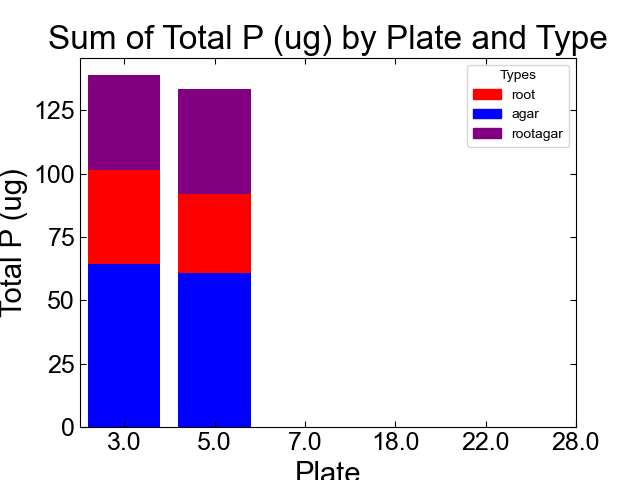

In [35]:


# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
select = df[df['treatment']=='0P']
select = select[select['plate']!=431]
select = select[select['plate']>0]



grouped = select.groupby(['time_since_crossing_day', 'type']).agg({'totP (ug)' :'sum'}).reset_index()

# Create a dictionary to map 'type' to a specific color
color_dict = {'root': 'red', 'agar': 'blue', 'rootagar': 'purple'}

# Create the bar plot
fig, ax = plt.subplots()

# Get unique plates to set as categorical x-ticks
unique_times = grouped['time_since_crossing_day'].unique()

# Initialize empty lists to hold bar heights for each plate
bar_data = {time: [] for time in unique_times}
bar_colors = {time: [] for time in unique_times}

# Prepare the data
for time in unique_times:
    # Filter data for each plate
    plate_data = grouped[grouped['time_since_crossing_day'] == time]
    select_time = select[select['time_since_crossing_day'] == time]

    # Initialize the bottom for the stacked bar
    bottom = 0
    num_plates = len(select_time["plate"].unique())
    print(num_plates)
    for index, row in plate_data.iterrows():
        # Add bar heights and colors
        bar_data[time].append(row['totP (ug)']/num_plates)
        bar_colors[time].append(color_dict[row['type']])

    # Plot the bars
for i, time in enumerate(unique_times):
    ax.bar(i, bar_data[time], bottom=[sum(bar_data[time][:j]) for j in range(len(bar_data[time]))], color=bar_colors[time])

# Add legend and labels
custom_legend = [plt.Rectangle((0,0),1,1, color=color_dict[key]) for key in color_dict.keys()]
ax.legend(custom_legend, color_dict.keys(), title='Types')

# Set x-ticks and labels
ax.set_xticks(range(len(unique_plates)))
ax.set_xticklabels([str(p) for p in unique_plates])

ax.set_xlabel('Plate')
ax.set_ylabel('Total P (ug)')
plt.title('Sum of Total P (ug) by Plate and Type')

plt.show()


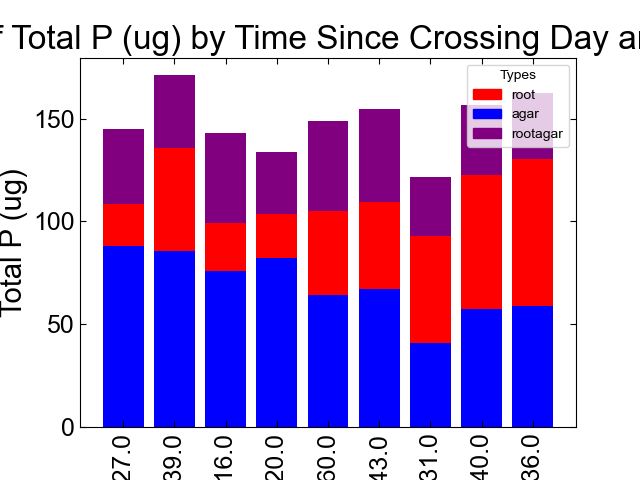

In [147]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume df is your dataframe
# Group the data by 'time_since_crossing_day', 'plate', and 'type', then sum up 'totP (ug)'
select = df[df['treatment']=='100P']
grouped = select.groupby(['time_since_crossing_day', 'plate', 'type'])['totP (ug)'].sum().reset_index()

# Create a dictionary to map 'type' to a specific color
color_dict = {'root': 'red', 'agar': 'blue', 'rootagar': 'purple'}

# Create the bar plot
fig, ax = plt.subplots()

# Get unique combinations of time_since_crossing_day and plate to set as categorical x-ticks
unique_combinations = grouped[['time_since_crossing_day', 'plate']].drop_duplicates().sort_values('time_since_crossing_day')

# Initialize empty lists to hold bar heights and colors
bar_data = {}
bar_colors = {}

# Prepare the data
for _, row in unique_combinations.iterrows():
    time, plate = row['time_since_crossing_day'], row['plate']
    combo_key = f"{time}_{plate}"
    # Filter data for each time_since_crossing_day and plate
    combo_data = grouped[(grouped['time_since_crossing_day'] == time) & (grouped['plate'] == plate)]
    
    bar_data[combo_key] = []
    bar_colors[combo_key] = []

    for index, row in combo_data.iterrows():
        # Add bar heights and colors
        bar_data[combo_key].append(row['totP (ug)'])
        bar_colors[combo_key].append(color_dict[row['type']])

# Plot the bars
for i, combo_key in enumerate(bar_data.keys()):
    ax.bar(i, bar_data[combo_key], bottom=[sum(bar_data[combo_key][:j]) for j in range(len(bar_data[combo_key]))], color=bar_colors[combo_key])

# Add legend and labels
custom_legend = [plt.Rectangle((0,0),1,1, color=color_dict[key]) for key in color_dict.keys()]
ax.legend(custom_legend, color_dict.keys(), title='Types')

# Set x-ticks and labels
ax.set_xticks(range(len(bar_data)))
ax.set_xticklabels([str(combo_key) for combo_key in bar_data.keys()], rotation=90)

ax.set_xlabel('Time Since Crossing Day_Plate')
ax.set_ylabel('Total P (ug)')
plt.title('Sum of Total P (ug) by Time Since Crossing Day and Plate')

plt.show()


In [120]:
bar_data

{'3.0_427.0': [87.84529416666666, 20.84985083333333, 36.141995833333326],
 '3.0_439.0': [85.76543958333333, 49.741967083333336, 35.55743916666667],
 '5.0_416.0': [76.0145575, 23.43225416666667, 43.3951175],
 '5.0_420.0': [82.0008125, 21.61332916666667, 30.123965833333333],
 '5.0_470.0': [64.44498291666667, 37.27006],
 '7.0_460.0': [64.10123166666666, 41.06230291666667, 43.66618666666666],
 '7.0_464.0': [60.76917083333333, 31.963234583333332, 43.09532166666666],
 '7.0_474.0': [60.60608499999999, 30.332169583333332, 40.18269083333333],
 '18.0_443.0': [67.39256625, 42.06424875, 45.372982083333326],
 '22.0_431.0': [40.98117333333333, 51.748532499999996, 28.900111666666668],
 '22.0_440.0': [57.507014999999996, 65.06239958333333, 34.20596833333333],
 '28.0_436.0': [58.8118825, 71.73817208333335, 31.724392499999997],
 '29.0_470.0': [37.11277375]}

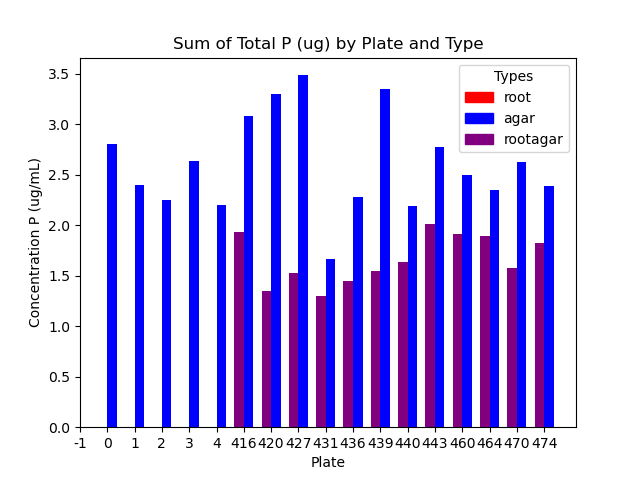

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
# Group the data by 'plate' and 'type', then sum up 'totP (ug)' and 'wet weight'
df = pd.read_excel(path_excel)
df = df[df['type'] != 'root']
grouped = df.groupby(['plate', 'type']).agg({'totP (ug)': 'sum', 'wet weight': 'sum'}).reset_index()

# Calculate the ratio: sum('totP (ug)') / sum('wet weight')
grouped['P_to_weight_ratio'] = grouped['totP (ug)'] / grouped['wet weight']

# Create a dictionary to map 'type' to a specific color
color_dict = {'root': 'red', 'agar': 'blue', 'rootagar': 'purple'}

# Create the bar plot
fig, ax = plt.subplots()

# Get unique plates to set as categorical x-ticks
unique_plates = grouped['plate'].unique()

# Initialize empty lists to hold bar heights for each plate
bar_data = {plate: [] for plate in unique_plates}
bar_colors = {plate: [] for plate in unique_plates}
bar_width = 0.35  # width of the bars
# Prepare the data
# Prepare and plot the data
for i, plate in enumerate(unique_plates):
    if plate>=0:
        plate_data = grouped[grouped['plate'] == plate]

        for j, row in plate_data.iterrows():
            color = color_dict[row['type']]
            position = i + (bar_width / 2) if row['type'] == 'agar' else i - (bar_width / 2)
            ax.bar(position, row['P_to_weight_ratio'], width=bar_width, color=color, label=row['type'])


# Add legend and labels
custom_legend = [plt.Rectangle((0,0),1,1, color=color_dict[key]) for key in color_dict.keys()]
ax.legend(custom_legend, color_dict.keys(), title='Types')

# Set x-ticks and labels
ax.set_xticks(range(len(unique_plates)))
ax.set_xticklabels([str(p) for p in unique_plates])

ax.set_xlabel('Plate')
ax.set_ylabel('Concentration P (ug/mL)')
plt.title('Sum of Total P (ug) by Plate and Type')

plt.show()


In [16]:
baseline = grouped[grouped['plate'].between(1,4)]['P_to_weight_ratio'].mean()
baseline_std = grouped[grouped['plate'].between(1,4)]['P_to_weight_ratio'].std()
baseline,baseline_std

(2.372968730380681, 0.19292165374196332)

Text(0, 0.5, 'Concentration P (ug/mL)')

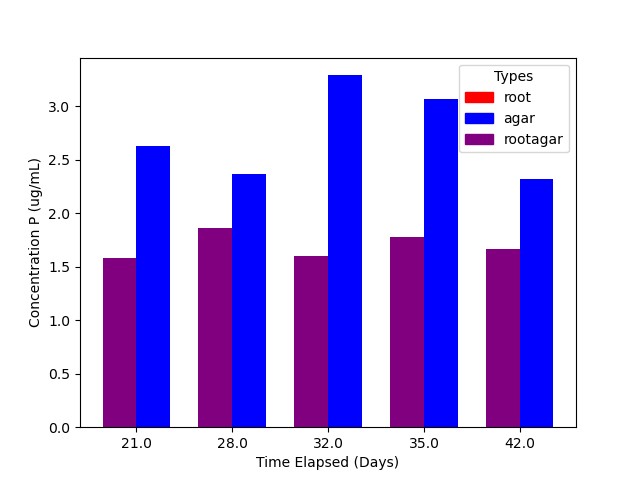

In [34]:
df = pd.read_excel(path_excel)

# Calculate time elapsed as in your original code
df['day'] = pd.to_datetime(df['day'], format='%Y%m%d')  # Update the format as necessary
df['day_start'] = pd.to_datetime(df['start'], format='%Y%m%d')  # Update the format as necessary

df['time_elapsed'] = df['day'] - df['day_start']
df['time_elapsed_day'] = df['time_elapsed'].dt.days

# Filter out rows where 'type' is 'root'
df = df[df['type'].isin([ 'rootagar',"agar"])]
df = df[df['plate'] >= 10]
df = df[df['plate'] != 431]



# Group the data by 'time_elapsed_day' and 'type', then sum up 'totP (ug)' and 'wet weight'
# grouped = df.groupby(['time_elapsed_day', 'type','plate']).agg({'totP (ug)': 'sum', 'wet weight': 'sum'}).reset_index()
grouped = df.groupby(['time_elapsed_day', 'type']).agg({'totP (ug)': 'sum', 'wet weight': 'sum'}).reset_index()

# Calculate the ratio: sum('totP (ug)') / sum('wet weight')
grouped['P_to_weight_ratio'] = grouped['totP (ug)'] / grouped['wet weight']

# Create a dictionary to map 'type' to a specific color
color_dict = {'root': 'red', 'agar': 'blue', 'rootagar': 'purple'}

# Create the bar plot
fig, ax = plt.subplots()

# Get unique time_elapsed_day to set as categorical x-ticks
unique_days = grouped['time_elapsed_day'].unique()

# Initialize empty lists to hold bar heights for each time_elapsed_day
bar_width = 0.35  # width of the bars

# Prepare the data
for i, day in enumerate(unique_days):
    day_data = grouped[grouped['time_elapsed_day'] == day]
    # print(day, day_data['plate'].unique())

    for j, row in day_data.iterrows():
        color = color_dict[row['type']]
        position = i + (bar_width / 2) if row['type'] == 'agar' else i - (bar_width / 2)
        ax.bar(position, row['P_to_weight_ratio'], width=bar_width, color=color, label=row['type'])

# Add legend and labels
custom_legend = [plt.Rectangle((0,0),1,1, color=color_dict[key]) for key in color_dict.keys()]
ax.legend(custom_legend, color_dict.keys(), title='Types')

# Set x-ticks and labels
ax.set_xticks(range(len(unique_days)))
ax.set_xticklabels([str(d) for d in unique_days])

ax.set_xlabel('Time Elapsed (Days)')
ax.set_ylabel('Concentration P (ug/mL)')

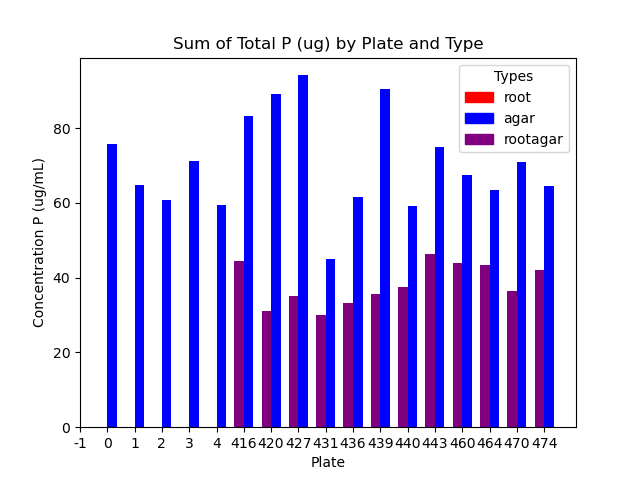

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
# Group the data by 'plate' and 'type', then sum up 'totP (ug)'
# Group the data by 'plate' and 'type', then sum up 'totP (ug)' and 'wet weight'
df = pd.read_excel(path_excel)
df = df[df['type'] != 'root']
grouped = df.groupby(['plate', 'type']).agg({'totP (ug)': 'sum', 'wet weight': 'sum'}).reset_index()

# Calculate the ratio: sum('totP (ug)') / sum('wet weight')
grouped['P_to_weight_ratio'] = grouped['totP (ug)'] / grouped['wet weight']

# Create a dictionary to map 'type' to a specific color
color_dict = {'root': 'red', 'agar': 'blue', 'rootagar': 'purple'}

# Create the bar plot
fig, ax = plt.subplots()

# Get unique plates to set as categorical x-ticks
unique_plates = grouped['plate'].unique()

# Initialize empty lists to hold bar heights for each plate
bar_data = {plate: [] for plate in unique_plates}
bar_colors = {plate: [] for plate in unique_plates}
bar_width = 0.35  # width of the bars
# Prepare the data
# Prepare and plot the data
for i, plate in enumerate(unique_plates):
    if plate>=0:
        plate_data = grouped[grouped['plate'] == plate]

        for j, row in plate_data.iterrows():
            color = color_dict[row['type']]
            position = i + (bar_width / 2) if row['type'] == 'agar' else i - (bar_width / 2)
            volume = 27 if row['type'] == 'agar' else 23
            ax.bar(position, row['P_to_weight_ratio']*volume, width=bar_width, color=color, label=row['type'])


# Add legend and labels
custom_legend = [plt.Rectangle((0,0),1,1, color=color_dict[key]) for key in color_dict.keys()]
ax.legend(custom_legend, color_dict.keys(), title='Types')

# Set x-ticks and labels
ax.set_xticks(range(len(unique_plates)))
ax.set_xticklabels([str(p) for p in unique_plates])

ax.set_xlabel('Plate')
ax.set_ylabel('Concentration P (ug/mL)')
plt.title('Sum of Total P (ug) by Plate and Type')

plt.show()


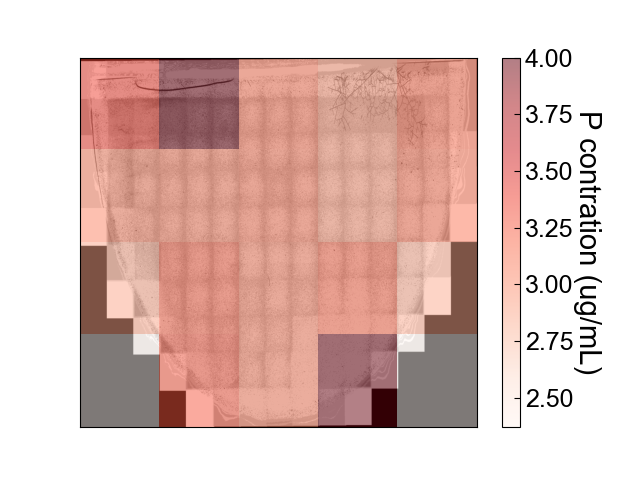

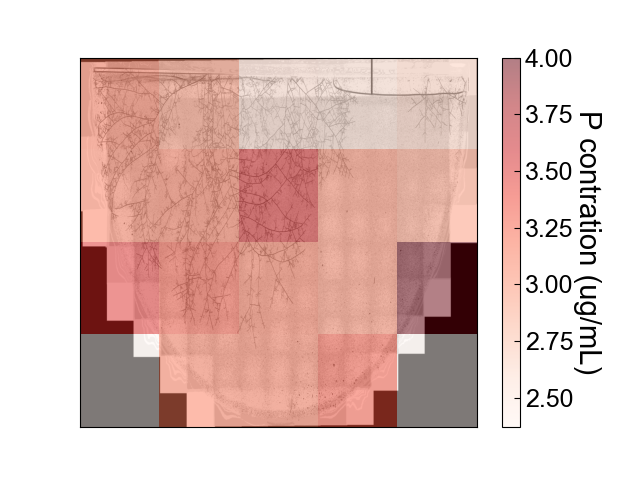

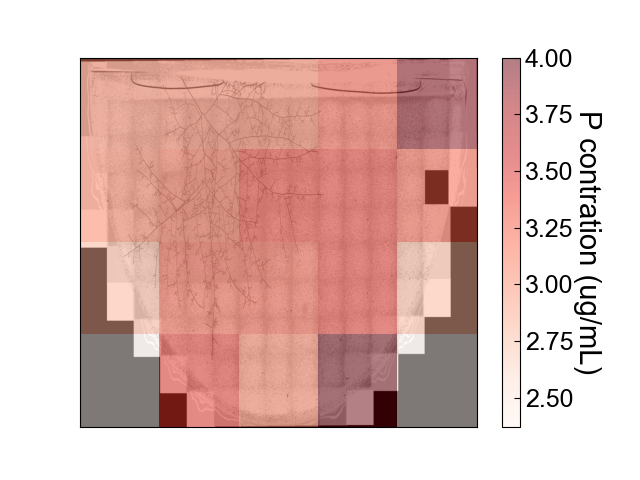

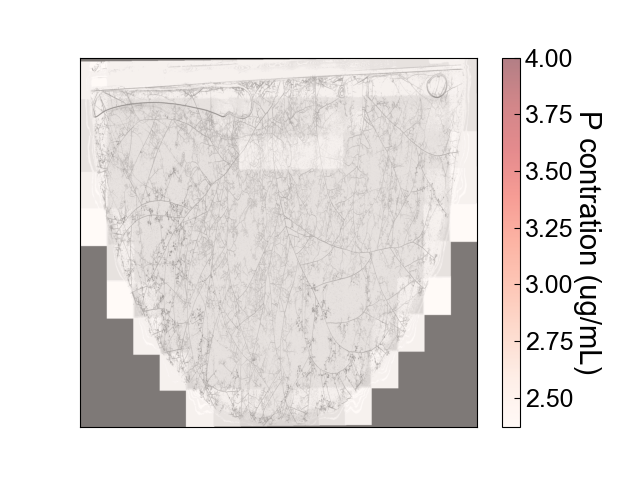

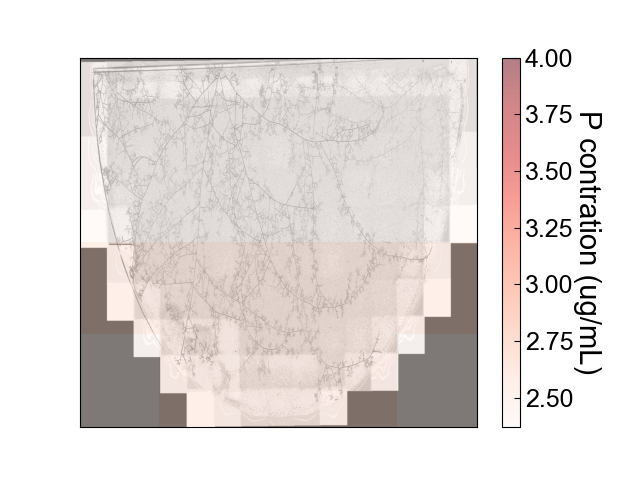

...

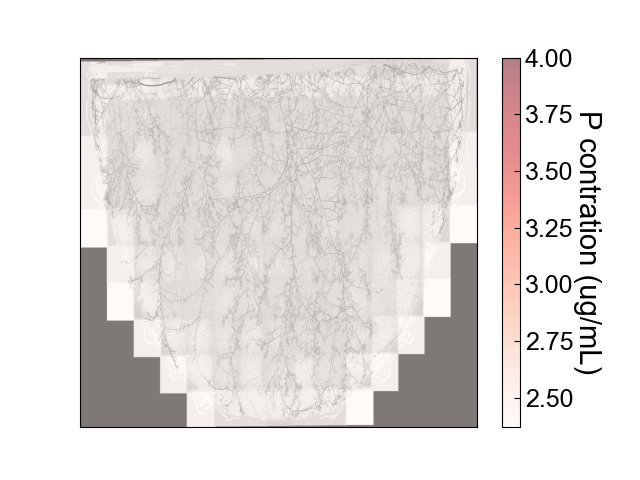

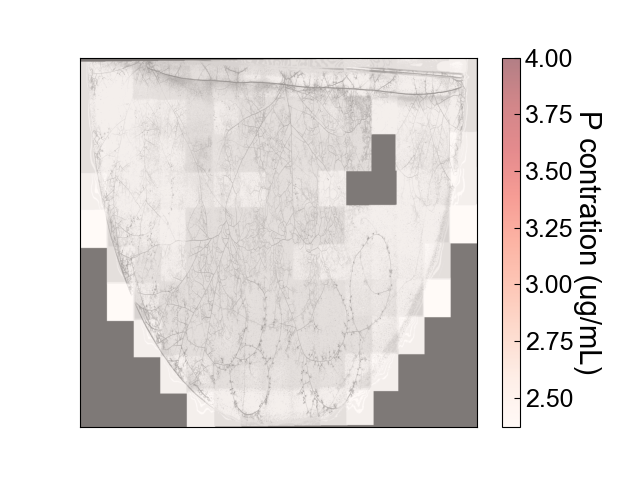

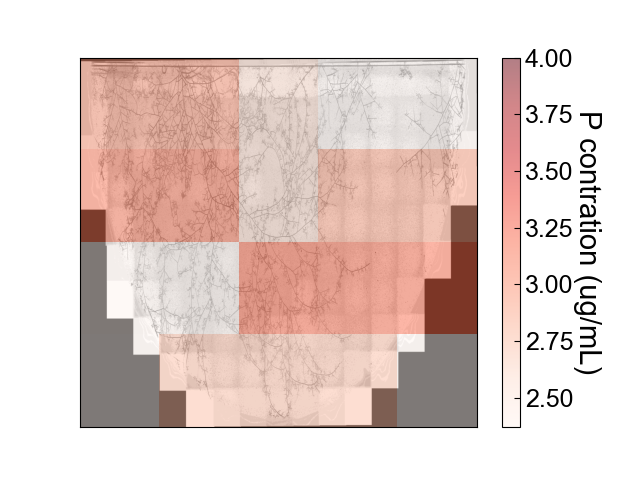

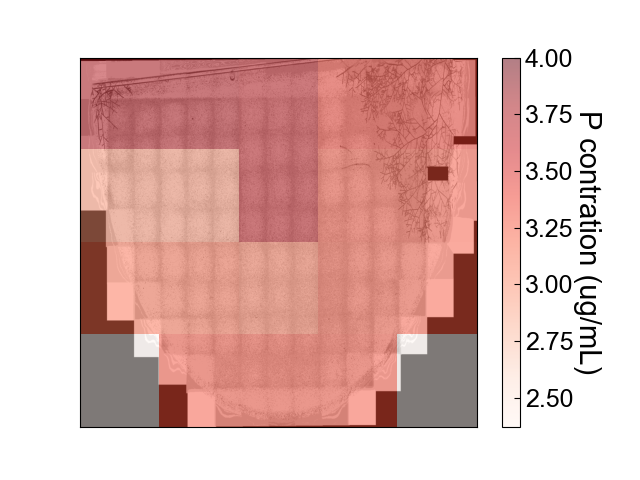

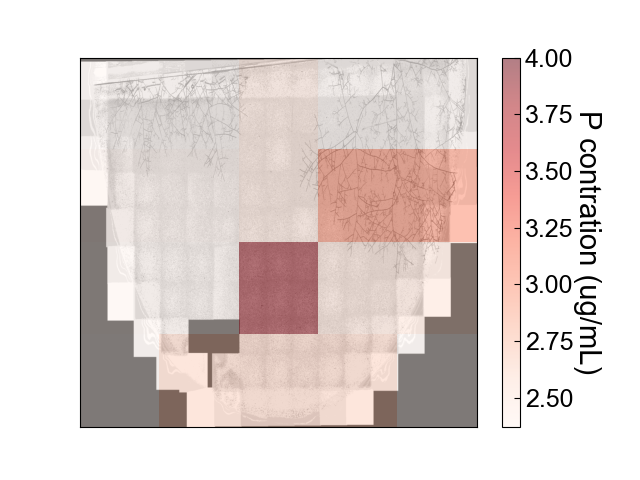

In [5]:
from PIL import Image
df = pd.read_excel(path_excel)
df = df[df['type'] != 'root']
df = df[df['type'] != 'rootagar']
df['pos'] = df['Sample_name'].str.split('-').str.get(1).astype(int)
df['C_P'] = df['totP (ug)']/df['wet weight'] 
basic_mapping = {
    1: (0, 0), 2: (0, 1), 3: (0, 2), 4: (0, 3), 5: (0, 4),
    6: (1, 0), 7: (1, 1), 8: (1, 2), 9: (1, 3), 10: (1, 4),
    11: (2, 0), 12: (2, 1), 13: (2, 2), 14: (2, 3), 15: (2, 4),
    16: (3, 1), 17: (3, 2), 18: (3, 3)
}

# Mapping for "coarse" to "basic"
coarse_to_basic_mapping = {
    1: [1, 2],
    2: [3, 8],
    3: [4, 5],
    4: [6, 7],
    5: [9, 10],
    6: [11, 12],
    7: [13],
    8: [14, 15],
    9: [16, 17, 18]
}

# Mapping for "simple" to "basic"
simple_to_basic_mapping = {
    0: list(range(1, 11)),
    1: list(range(11, 19))
}

# Initialize plot
plt.close("all")
for idx, unique_id in enumerate(df['unique_id'].unique()):
    if type(unique_id) ==str:
        fig,ax = plt.subplots()
        plate_df = df[df['unique_id'] == unique_id]

        # Create an empty 4x5 grid (for "basic" arrangement, adjust as needed)
        grid = np.zeros((4, 5))

        for i, row in plate_df.iterrows():
            arrangement = row['arrangement']
            pos = row['pos']
            totP = row['C_P']

            if arrangement == 'basic':
                x, y = basic_mapping[pos]
                grid[x, y] = totP

            elif arrangement == 'simple':
                for basic_pos in simple_to_basic_mapping[pos]:
                    x, y = basic_mapping[basic_pos]
                    grid[x, y] = totP

            elif arrangement == 'coarse':
                for basic_pos in coarse_to_basic_mapping[pos]:
                    x, y = basic_mapping[basic_pos]
                    grid[x, y] = totP

        # Plotting the grid
        image_path = os.path.join("C:\\Users\\coren\\AMOLF-SHIMIZU Dropbox\\DATA\\PRINCE_ANALYSIS", unique_id)

        # Find the image in the folder with name like 'StitchedImage_YYYYMMDD_hhmm.tif'
        for image_file in os.listdir(image_path):
            if 'StitchedImage' in image_file:
                img = Image.open(os.path.join(image_path, image_file))

        # Display the image
        ax.imshow(np.flip(np.array(img),axis = 1), cmap='gray', extent=[-0.5, 4.5, -0.5, 3.5])
        c = ax.imshow(grid, cmap='Reds', aspect='auto',vmin=mean0P,vmax=4,alpha = 0.5)
        cbar = fig.colorbar(c, ax=ax)
        cbar.set_label('P contration (ug/mL)', rotation=270, labelpad=20)
        # ax.set_title(f'Plate {unique_id}')
        ax.set_xticks([])
        ax.set_yticks([])
        
    # break
# plt.show()

In [ ]:
for polygon in polygons:
    

In [84]:
df = df[df['C_P'] >=10]
df

,Sample_name,type,day,arrangement,plate,unique_id,wet weight,lost weight,dry weight,Tube name,added acid,measured P,Measured K,tot P (nmol),totP (ug),pos,C_P
17,427-18,agar,2023-07-10,basic,427,427_20230707,0.901,0.012,NaN,18,0.5,379.525,NaN,333.07625,10.325364,18,11.459893


(array([10.,  8., 10., 13., 30., 16.,  3.,  3.,  1.,  2.]),
 array([2.08710572, 2.3167353 , 2.54636488, 2.77599445, 3.00562403,
        3.23525361, 3.46488319, 3.69451277, 3.92414234, 4.15377192,
        4.3834015 ]),
 <BarContainer object of 10 artists>)

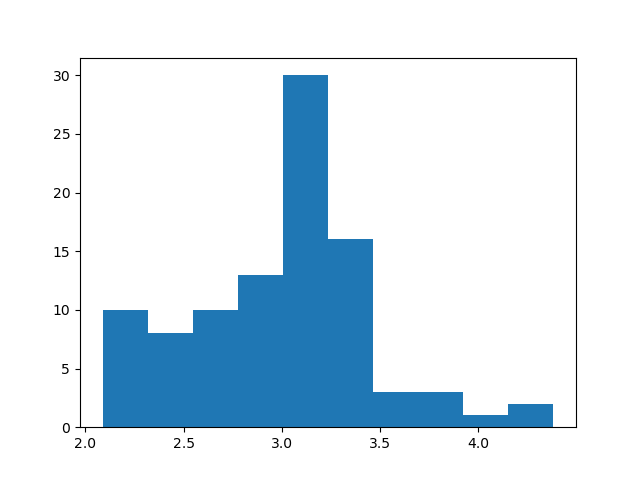

In [87]:
df = pd.read_excel(path_excel)
df = df[df['type'] != 'root']
df = df[df['type'] != 'rootagar']
df = df[df['type'] != 'reference sample']
df = df[df['type'] != 'empty']
df = df[df['comment'] != 'outlier']
df = df[df['plate'] != 431]



df['pos'] = df['Sample_name'].str.split('-').str.get(1).astype(int)
df['C_P'] = df['totP (ug)']/df['wet weight'] 
fig,ax = plt.subplots()
ax.hist(df['C_P'])

In [93]:
df['time_elapsed']

0      3 days
1      3 days
2      3 days
3      3 days
4      3 days
        ...  
151   29 days
152   29 days
153   29 days
154   29 days
155   29 days
Name: time_elapsed, Length: 96, dtype: timedelta64[ns]

In [109]:
df['date_from_unique_id']

0     2023-07-07
1     2023-07-07
2     2023-07-07
3     2023-07-07
4     2023-07-07
         ...    
151   2023-07-09
152   2023-07-09
153   2023-07-09
154   2023-07-09
155   2023-07-09
Name: date_from_unique_id, Length: 96, dtype: datetime64[ns]

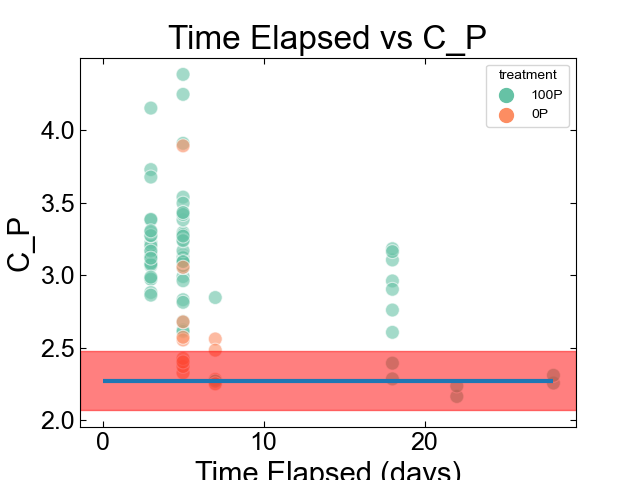

In [158]:
import seaborn as sns
fig,ax = plt.subplots()

df = pd.read_excel(path_excel)
df = df[df['type'] != 'root']
df = df[df['type'] != 'rootagar']
df = df[df['type'] != 'reference sample']
df = df[df['type'] != 'empty']
df = df[df['comment'] != 'outlier']
df = df[df['plate'] != 431]
df = df[df['plate'] != 0]
df = df[df['plate'] != 1]



df['C_P'] = df['totP (ug)']/df['wet weight'] 

df['date_from_unique_id'] = pd.to_datetime(df['unique_id'].str.split('_').str[1], format='%Y%m%d')
    
# Convert 'day' column to datetime
df['day'] = pd.to_datetime(df['day'], format='%Y%m%d')  # Update the format as necessary

# Calculate time elapsed and store it in a new column
df['time_elapsed'] = df['day'] - df['date_from_unique_id']
df['time_elapsed_day'] = df['time_elapsed'].dt.days
# Filter DataFrame by treatment type
df_0P = df[df['treatment'] == '0P']
df_100P = df[df['treatment'] == '100P']

# Create scatter plot
sns.scatterplot(x='time_elapsed_day', y='C_P', data=df, hue='treatment', palette="Set2",alpha = 0.6)


plt.title('Time Elapsed vs C_P')
plt.xlabel('Time Elapsed (days)')
plt.ylabel('C_P')
# plt.axhline(y=baseline, color='r', linestyle='--', label='Mean')
mean0P = np.median(df[df['type']=='agar0P']['C_P'])
std = np.std(df[df['type']=='agar0P']['C_P'])
lower_bound = mean0P-std
upper_bound = mean0P+std
ax.axhspan(lower_bound, upper_bound, color='red', alpha=0.5, label='Confidence Interval')

ax.hlines(mean0P,0,28)
plt.show()

NameError: name 'lower_bound' is not defined

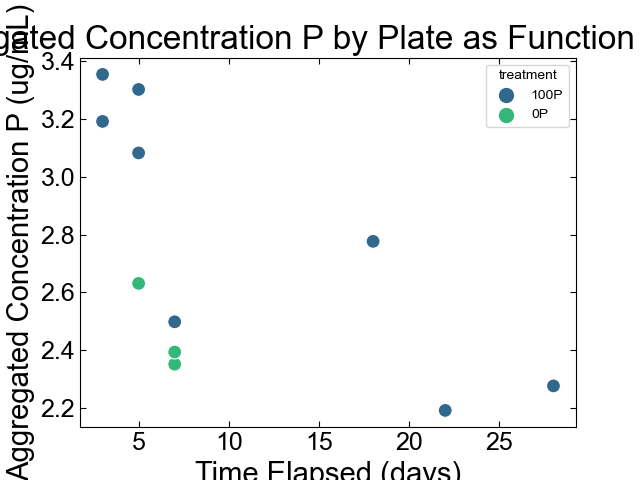

In [152]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
fig,ax = plt.subplots()
df = pd.read_excel(path_excel)
df = df[df['type'] != 'root']
df = df[df['type'] != 'rootagar']
df = df[df['type'] != 'reference sample']
df = df[df['type'] != 'empty']
df = df[df['comment'] != 'outlier']
df = df[df['plate'] != 431]
df = df[df['plate'] != 0]
df = df[df['plate'] != 1]
# df = df[df['treatment'] != '0P']


df['C_P'] = df['totP (ug)']/df['wet weight'] 

df['date_from_unique_id'] = pd.to_datetime(df['unique_id'].str.split('_').str[1], format='%Y%m%d')
    
# Convert 'day' column to datetime
df['day'] = pd.to_datetime(df['day'], format='%Y%m%d')  # Update the format as necessary

# Calculate time elapsed and store it in a new column
df['time_elapsed'] = df['day'] - df['date_from_unique_id']
df['time_elapsed_day'] = df['time_elapsed'].dt.days

# Group the data by 'plate' and 'time_elapsed_day', then sum up 'totP (ug)' and 'wet weight'
grouped = df.groupby(['plate', 'time_elapsed_day','treatment']).agg({'totP (ug)': 'sum', 'wet weight': 'sum'}).reset_index()

# Calculate the ratio: sum('totP (ug)') / sum('wet weight')
grouped['P_to_weight_ratio'] = grouped['totP (ug)'] / grouped['wet weight']
grouped['plate'] = grouped['plate'].astype(str)


# Scatter plot for aggregated concentration by plate as function of time elapsed
sns.scatterplot(x='time_elapsed_day', y='P_to_weight_ratio', data=grouped, hue='treatment', palette='viridis')

# Boxplot for each day
# sns.boxplot(x='time_elapsed_day', y='P_to_weight_ratio', data=grouped, color='grey', boxprops=dict(alpha=0.4))

plt.title('Aggregated Concentration P by Plate as Function of Time')
plt.xlabel('Time Elapsed (days)')
plt.ylabel('Aggregated Concentration P (ug/mL)')
ax.axhspan(lower_bound, upper_bound, color='red', alpha=0.5, label='Confidence Interval')
plt.axhline(y=baseline, color='r', linestyle='--', label='Mean')
plt.show()


In [123]:
grouped

,plate,time_elapsed_day,totP (ug),wet weight,P_to_weight_ratio
0,416,5,76.014557,24.6593,3.082592
1,420,5,82.000812,24.8320,3.302223
2,427,3,77.519930,24.2888,3.191592
3,436,28,58.811883,25.8351,2.276433
4,439,3,85.765440,25.5689,3.354287
5,440,22,57.507015,26.2389,2.191670
6,443,18,67.392566,24.2715,2.776613
7,460,7,64.101232,25.6588,2.498216
